# <span style="color:blue">CV-HW3</span>
### <span style="color:blue">Nazhin Nikkhahbahrami 810102530</span>

## <span style="color:red">Part1 : Cat face detection</span>
### 1.1


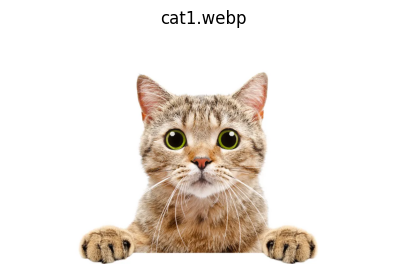

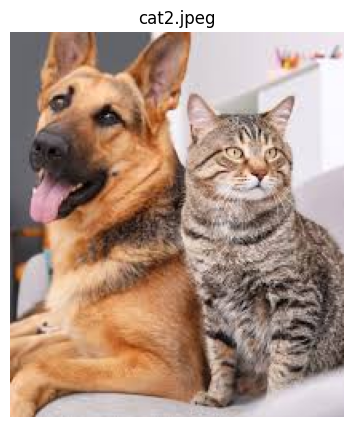

In [1]:
import cv2
import matplotlib.pyplot as plt
import os

folder_path = 'Cat_detection'

for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.webp')):
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path)
        if img is not None:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(5, 5))
            plt.imshow(img_rgb)
            plt.title(filename)
            plt.axis('off')
            plt.show()
        else:
            print(f"Problem in reading files: {filename}")

### 1.2

In [2]:
cascade_path = 'Cat_detection/Cat_detection/haarcascade_frontalcatface_extended.xml'
cat_cascade = cv2.CascadeClassifier(cascade_path)

if cat_cascade.empty():
    print("Error loading cascade file!")
else:
    print("Cascade loaded successfully.")

Cascade loaded successfully.


### 1.3

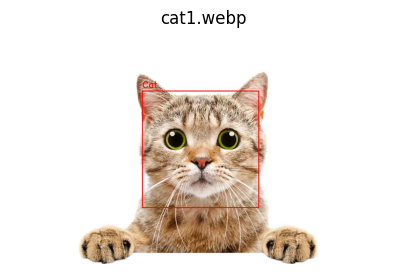

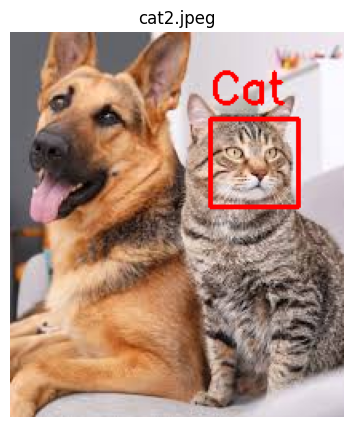

In [3]:
for root, dirs, files in os.walk('Cat_detection'):
    for filename in files:
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.webp')):
            img_path = os.path.join(root, filename)
            img = cv2.imread(img_path)
            
            if img is not None:
                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                blurred = cv2.GaussianBlur(gray, (11,11), 0)
                
                cats = cat_cascade.detectMultiScale(blurred, scaleFactor=1.1, minNeighbors=5, minSize=(50, 50))
                
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                
                for (x, y, w, h) in cats:
                    cv2.rectangle(img_rgb, (x, y), (x+w, y+h), (255, 0, 0), 2)
                    cv2.putText(img_rgb, 'Cat', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
                    
                plt.figure(figsize=(5, 5))
                plt.imshow(img_rgb)
                plt.title(filename)
                plt.axis('off')
                plt.show()

Process & Parameters

Images were converted to grayscale and blurred to reduce noise. While the Haar Cascade parameters were kept at the baseline (scaleFactor=1.1, minNeighbors=5, minSize=(50,50)), we can tune the detection by adjusting the Gaussian Blur kernel size, scaleFactor, minNeighbors, or minSize to filter out errors.

Error & Reason (Initial Attempt)

In cat1.webp, a False Positive occurred where a smaller, extra box was drawn around the cat's nose. This happened because Haar models look for light/dark contrast patterns, and the sharp details around the muzzle accidentally matched the criteria for a face at a smaller scale.

Modification & Success

To fix this, we changed the Gaussian Blur kernel size from (5, 5) to (11, 11). This smoothed out the misleading textures on the nose while preserving the overall face structure. As a result, the model successfully detected the authentic cat faces in both images and correctly ignored the dog.
### 1.4

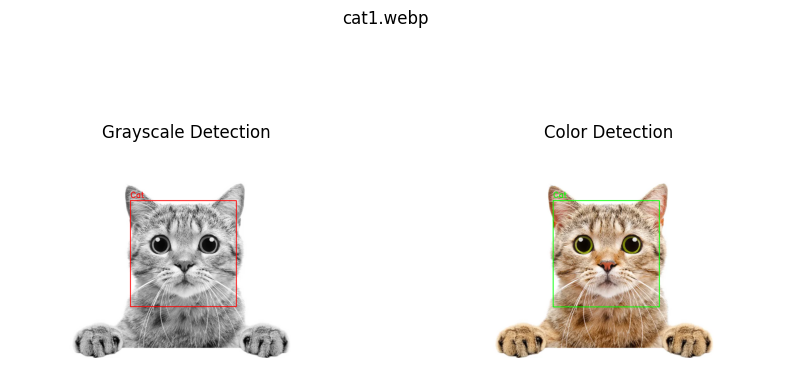

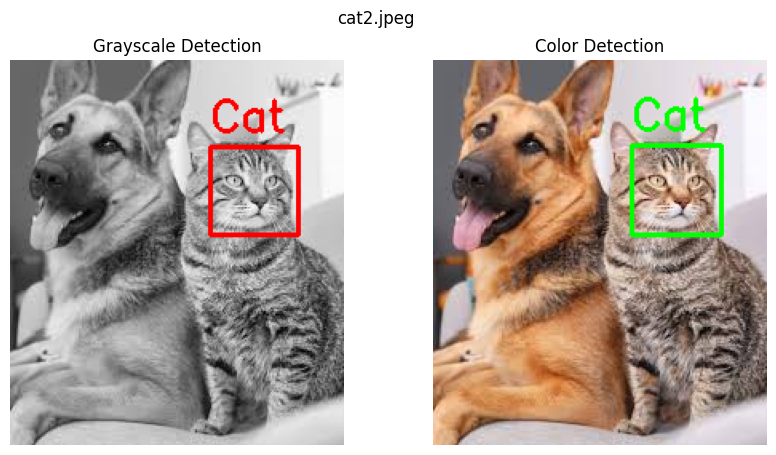

In [4]:
for root, dirs, files in os.walk('Cat_detection'):
    for filename in files:
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.webp')):
            img_path = os.path.join(root, filename)
            img = cv2.imread(img_path)
            
            if img is not None:
                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                blurred_gray = cv2.GaussianBlur(gray, (11, 11), 0)
                cats_gray = cat_cascade.detectMultiScale(blurred_gray, scaleFactor=1.1, minNeighbors=5, minSize=(50, 50))
                
                blurred_color = cv2.GaussianBlur(img, (11, 11), 0)
                cats_color = cat_cascade.detectMultiScale(blurred_color, scaleFactor=1.1, minNeighbors=5, minSize=(50, 50))
                
                img_res_gray = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
                for (x, y, w, h) in cats_gray:
                    cv2.rectangle(img_res_gray, (x, y), (x+w, y+h), (255, 0, 0), 2)
                    cv2.putText(img_res_gray, 'Cat', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
                    
                img_res_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                for (x, y, w, h) in cats_color:
                    cv2.rectangle(img_res_color, (x, y), (x+w, y+h), (0, 255, 0), 2)
                    cv2.putText(img_res_color, 'Cat', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
                    
                fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                
                axes[0].imshow(img_res_gray)
                axes[0].set_title('Grayscale Detection')
                axes[0].axis('off')
                
                axes[1].imshow(img_res_color)
                axes[1].set_title('Color Detection')
                axes[1].axis('off')
                
                plt.suptitle(filename)
                plt.show()

Since the Haar model inherently operates on intensity (grayscale) values, whether the input is color or grayscale has no effect on improving the output or resolving the False Positive error, resulting in the exact same misclassification in both cases.
### 1.5

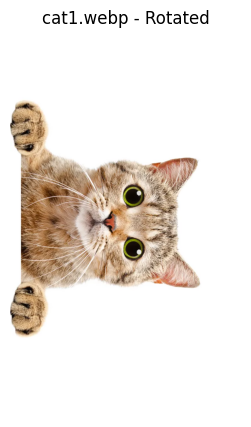

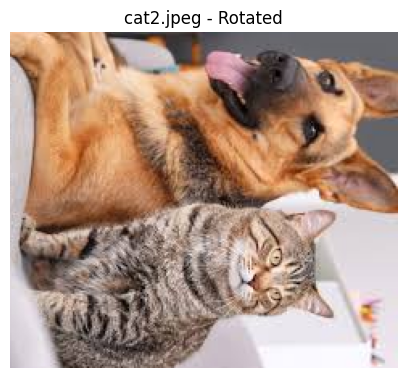

In [5]:
for root, dirs, files in os.walk('Cat_detection'):
    for filename in files:
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.webp')):
            img_path = os.path.join(root, filename)
            img = cv2.imread(img_path)
            
            if img is not None:
                rotated_img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
                
                gray = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2GRAY)
                blurred = cv2.GaussianBlur(gray, (11, 11), 0)
                
                cats = cat_cascade.detectMultiScale(blurred, scaleFactor=1.1, minNeighbors=5, minSize=(50, 50))
                
                img_rgb = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB)
                
                for (x, y, w, h) in cats:
                    cv2.rectangle(img_rgb, (x, y), (x+w, y+h), (255, 0, 0), 2)
                    cv2.putText(img_rgb, 'Cat', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
                    
                plt.figure(figsize=(5, 5))
                plt.imshow(img_rgb)
                plt.title(f"{filename} - Rotated")
                plt.axis('off')
                plt.show()

Process: The input images were rotated 90 degrees clockwise before applying the Haar Cascade detection.

Result: The model failed to detect the cat faces in the rotated images.

Reason: Haar Cascade classifiers are not rotation-invariant. The model is trained specifically on frontal faces and relies on fixed vertical and horizontal contrast patterns (such as eyes being horizontally aligned above the nose). A 90-degree rotation breaks these geometric patterns, rendering the model unable to recognize the features.

## <span style="color:red">Part2 : Face,age and gender detection</span>
### 2.1


In [6]:
face_model = 'Age-Gender/Age-Gender/opencv_face_detector_uint8.pb'
face_config = 'Age-Gender/Age-Gender/opencv_face_detector.pbtxt'
face_net = cv2.dnn.readNet(face_model, face_config)

age_model = 'Age-Gender/Age-Gender/age_net.caffemodel'
age_config = 'Age-Gender/Age-Gender/age_deploy.prototxt'
age_net = cv2.dnn.readNet(age_model, age_config)

gender_model = 'Age-Gender/Age-Gender/gender_net.caffemodel'
gender_config = 'Age-Gender/Age-Gender/gender_deploy.prototxt'
gender_net = cv2.dnn.readNet(gender_model, gender_config)

### 2.2

In [7]:
ageList = ["(0-2)", "(4-6)", "(8-12)", "(15-20)", "(25-32)", "(38-43)", "(48-53)", "(60-100)"]
genderList = ["Male", "Female"]
MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)

### 2.3

In [10]:
def highlightFace(net, frame, conf_threshold=0.7):
    frameOpencvDnn = frame.copy()
    frameHeight = frameOpencvDnn.shape[0]
    frameWidth = frameOpencvDnn.shape[1]
    
    blob = cv2.dnn.blobFromImage(frameOpencvDnn, 1.0, (300, 300), (104, 117, 123), swapRB=True)
    net.setInput(blob)
    detections = net.forward()
    
    faceBoxes = []
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > conf_threshold:
            x1 = int(detections[0, 0, i, 3] * frameWidth)
            y1 = int(detections[0, 0, i, 4] * frameHeight)
            x2 = int(detections[0, 0, i, 5] * frameWidth)
            y2 = int(detections[0, 0, i, 6] * frameHeight)
            faceBoxes.append([x1, y1, x2, y2])
            cv2.rectangle(frameOpencvDnn, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
    return frameOpencvDnn, faceBoxes

 Face Detection Implementation (`highlightFace`)

The `highlightFace` function is designed to localize and extract human faces from an input frame using a deep learning-based Face Detector network:

* **Preprocessing (`cv2.dnn.blobFromImage`):** The input image is converted into a structured 4D blob. It scales the image, resizes it to 300x300 pixels, subtracts the baseline mean intensity values (104, 117, 123), and sets `swapRB=True` to match the expected RGB channel ordering of the network.
* **Inference:** The processed blob is passed to the network using `net.setInput()`, and a forward pass (`net.forward()`) is executed to generate the detection matrix.
* **Filtering & Visualizing:** The function iterates through all candidate detections. Detections with a confidence score greater than the `conf_threshold=0.7` are retained. The normalized bounding box coordinates are mapped back to the original image dimensions, stored inside `faceBoxes`, and visualized by drawing a green rectangle around each identified face.
### 2.4

In [11]:
def detect_face_age_gender(frame, face_net, age_net, gender_net):
    padding = 20
    result_img, faceBoxes = highlightFace(face_net, frame)
    
    if not faceBoxes:
        return result_img
        
    for faceBox in faceBoxes:
        x1 = max(0, faceBox[0] - padding)
        y1 = max(0, faceBox[1] - padding)
        x2 = min(frame.shape[1] - 1, faceBox[2] + padding)
        y2 = min(frame.shape[0] - 1, faceBox[3] + padding)
        
        face = frame[y1:y2, x1:x2]
        
        if face.size == 0:
            continue
            
        blob = cv2.dnn.blobFromImage(face, 1.0, (227, 227), MODEL_MEAN_VALUES, swapRB=False)
        
        gender_net.setInput(blob)
        gender_preds = gender_net.forward()
        gender = genderList[gender_preds[0].argmax()]
        
        age_net.setInput(blob)
        age_preds = age_net.forward()
        age = ageList[age_preds[0].argmax()]
        
        label = f"{gender}, {age}"
        cv2.putText(result_img, label, (faceBox[0], max(30, faceBox[1] - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2, cv2.LINE_AA)
        
    return result_img

 Age and Gender Prediction Implementation (`detect_face_age_gender`)

The `detect_face_age_gender` function coordinates the entire pipeline by linking face detection with downstream demographic classification networks:

* **Face Localization & Padding:** It captures the bounding boxes from `highlightFace` and applies a safe 20-pixel padding around each detected face area, utilizing border constraints to avoid array slicing errors.
* **Demographic Preprocessing:** Each cropped face region is converted into a secondary 4D blob resized to 227x227 pixels, using the specific `MODEL_MEAN_VALUES` subtraction and setting `swapRB=False`.
* **Classification Inference:** The processed face blob is sequentially passed into the `gender_net` and `age_net`. The index of the maximum response (`.argmax()`) from the output layers extracts the predicted class string from `genderList` and `ageList`.
* **Annotation:** A formatted text string displaying the predicted Gender and Age group is drawn dynamically directly above each detected person's bounding box.
### 2.5

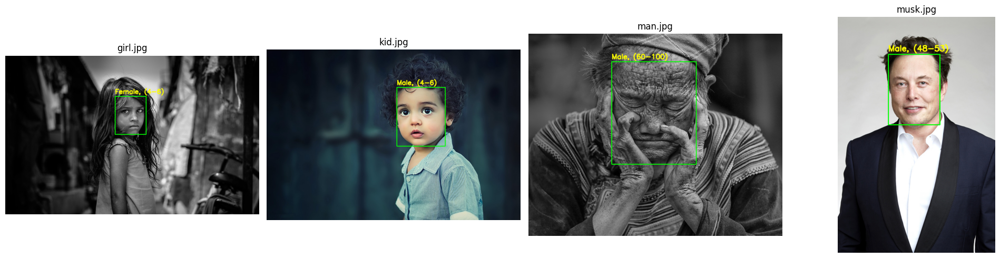

In [14]:
import matplotlib.pyplot as plt

image_files = ['girl.jpg', 'kid.jpg', 'man.jpg', 'musk.jpg']
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, img_file in enumerate(image_files):
    img_path = f"Age-Gender/{img_file}"
    img = cv2.imread(img_path)
    
    if img is not None:
        result_img = detect_face_age_gender(img, face_net, age_net, gender_net)
        result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
        
        axes[i].imshow(result_rgb)
        axes[i].set_title(img_file)
        axes[i].axis('off')

plt.tight_layout()
plt.show()

Performance Analysis of Face, Age, and Gender Detection Models:

*Face Detection:

 The base model (opencv_face_detector) successfully detected faces in all 4 images. The drawn bounding boxes are highly accurate and successfully isolated the faces across various lighting conditions (black and white, color, dark, and bright environments).

*Gender Prediction:

 The Caffe model demonstrated excellent performance in this test, correctly predicting the gender of all individuals in the images.

*Age Prediction:

For the adults, the model's accuracy is exceptionally high. Elon Musk was correctly classified into the (48-53) range, and the elderly individual was accurately categorized into the (60-100) range based on prominent facial features and wrinkles.

For the children (girl.jpg and kid.jpg), the system successfully processed their facial features and returned the (4-6) age bracket for both, demonstrating that the network architecture and data pipeline executed correctly.
### 2.6 : ROBUSTNESS
### 2.6.1: 90 deg Rotation

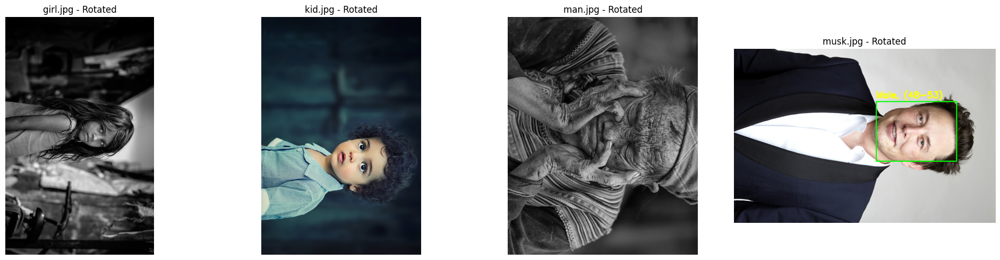

In [15]:
image_files = ['girl.jpg', 'kid.jpg', 'man.jpg', 'musk.jpg']
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, img_file in enumerate(image_files):
    img_path = os.path.join('Age-Gender', img_file)
    img = cv2.imread(img_path)
    
    if img is not None:
        rotated_img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
        result_img = detect_face_age_gender(rotated_img, face_net, age_net, gender_net)
        result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
        
        axes[i].imshow(result_rgb)
        axes[i].set_title(f"{img_file} - Rotated")
        axes[i].axis('off')

plt.tight_layout()
plt.show()

When rotated 90 degrees, the DNN face detector failed to identify the faces in three images (girl.jpg, kid.jpg, man.jpg), resulting in no output. However, it successfully detected the face, age, and gender in musk.jpg.

This image is a high-resolution studio portrait with perfect lighting, high contrast, and a uniform background. These ideal visual conditions allowed the neural network's filters to strongly activate and surpass the conf_threshold=0.7, despite the 90-degree orientation. Once the face was cropped, the age and gender Caffe models processed the blob perfectly.

*Why Others Failed? The remaining images introduce additional variables such as severe shadows (girl.jpg), complex backgrounds (kid.jpg), and partial facial occlusions (hands covering the face in man.jpg). The combination of these visual obstacles with the 90-degree rotation caused the detection confidence to drop below the required 0.7 threshold, leading to false negatives.

Technical Analysis: Unlike the Haar Cascade model, the OpenCV DNN face detector (based on SSD ResNet-10) extracts deeper, more complex geometric features. While primarily trained on upright faces, it exhibits a marginal degree of rotation robustness under optimal conditions.
### 2.6.2: Change in lighting 

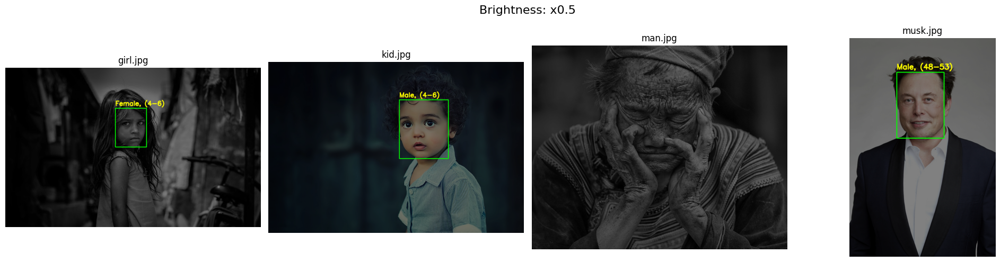

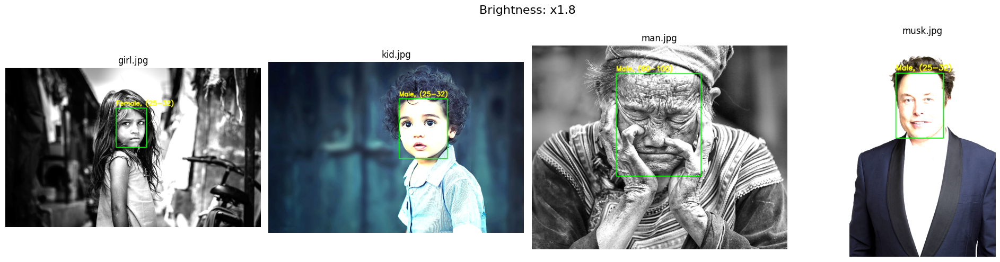

In [19]:
image_files = ['girl.jpg', 'kid.jpg', 'man.jpg', 'musk.jpg']
factors = [0.5, 1.8]

for factor in factors:
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(f"Brightness: x{factor}", fontsize=16)
    
    for i, img_file in enumerate(image_files):
        img_path = os.path.join('Age-Gender', img_file)
        img = cv2.imread(img_path)
        
        if img is not None:
            img_adjusted = cv2.convertScaleAbs(img, alpha=factor, beta=0)
            
            result_img = detect_face_age_gender(img_adjusted, face_net, age_net, gender_net)
            result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
            
            axes[i].imshow(result_rgb)
            axes[i].set_title(img_file)
            axes[i].axis('off')
            
    plt.tight_layout()
    plt.show()

**Brightness x0.5 (Darkened):

The face detection model successfully located faces in girl.jpg, kid.jpg, and musk.jpg, while retaining accurate age and gender predictions.

However, it completely failed to detect the face in man.jpg. Since the original image was already dark and heavily shadowed with hands partially obscuring the face, multiplying the brightness by 0.5 crushed the remaining contrast. The geometric features were lost in the shadows, resulting in a False Negative.

**Brightness x1.8 (Brightened):

The face detection model successfully drew bounding boxes for all four individuals.

*Age Model Failure: The age prediction network failed significantly under these conditions, classifying three entirely different subjects (girl, kid, and musk) into the exact same (25-32) age bracket. This happens because multiplying pixel values by 1.8 causes severe overexposure and pixel saturation. Essential age-determining features such as skin texture, micro-wrinkles, and soft natural shadows are "washed out" or flattened into pure white patches. Without these textural cues, the age classifier outputs inaccurate predictions.

The gender prediction model remained robust and accurate across all brightened images.
### 2.6.3:Intentional face blurring
Blurring function:

In [16]:
def detect_face_age_gender_blurred(frame, face_net, age_net, gender_net):
    padding = 20
    result_img, faceBoxes = highlightFace(face_net, frame)
    
    if not faceBoxes:
        return result_img
        
    for faceBox in faceBoxes:
        x1 = max(0, faceBox[0] - padding)
        y1 = max(0, faceBox[1] - padding)
        x2 = min(frame.shape[1] - 1, faceBox[2] + padding)
        y2 = min(frame.shape[0] - 1, faceBox[3] + padding)
        
        face = frame[y1:y2, x1:x2]
        
        if face.size == 0:
            continue
            
        blurred_face = cv2.GaussianBlur(face, (51, 51), 0)
        result_img[y1:y2, x1:x2] = blurred_face
        
        blob = cv2.dnn.blobFromImage(blurred_face, 1.0, (227, 227), MODEL_MEAN_VALUES, swapRB=False)
        
        gender_net.setInput(blob)
        gender_preds = gender_net.forward()
        gender = genderList[gender_preds[0].argmax()]
        
        age_net.setInput(blob)
        age_preds = age_net.forward()
        age = ageList[age_preds[0].argmax()]
        
        label = f"{gender}, {age}"
        cv2.putText(result_img, label, (faceBox[0], max(30, faceBox[1] - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2, cv2.LINE_AA)
        
    return result_img

 Intentional Face Blurring Pipeline (`detect_face_age_gender_blurred`)

This function evaluates model robustness against severe high-frequency data loss:
* **Localization & Anonymization:** It extracts detected faces, applies a heavy `(51, 51)` Gaussian Blur kernel to completely smooth out facial textures, and blends the blurred region back into the final output image.
* **Degraded Inference:** The heavily smoothed face blob is passed to the age and gender networks to test whether classification remains viable without micro-facial features.

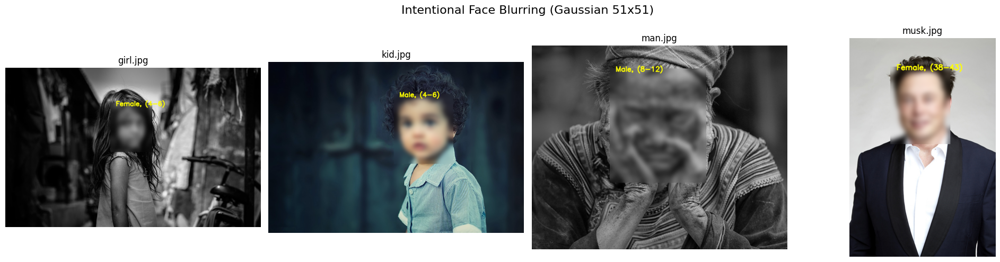

In [21]:
image_files = ['girl.jpg', 'kid.jpg', 'man.jpg', 'musk.jpg']
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
fig.suptitle("Intentional Face Blurring (Gaussian 51x51)", fontsize=16)

for i, img_file in enumerate(image_files):
    img_path = os.path.join('Age-Gender', img_file)
    img = cv2.imread(img_path)
    
    if img is not None:
        result_img = detect_face_age_gender_blurred(img.copy(), face_net, age_net, gender_net)
        result_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
        
        axes[i].imshow(result_rgb)
        axes[i].set_title(img_file)
        axes[i].axis('off')
        
plt.tight_layout()
plt.show()

The aggressive blurring severely degrades the model's performance, leading to critical failures in both age and gender predictions. The model can no longer reliably determine these attributes.

**Key Failures Observed in Output:

*Age Misclassification: The model catastrophically failed on the elderly subject (man.jpg), predicting the age bracket as (8-12) years old.

*Gender Misclassification: The model incorrectly classified Elon Musk (musk.jpg) as Female.

**Technical Reasoning:

*Age Estimation: Age prediction networks heavily rely on high-frequency spatial features such as skin texture, deep wrinkles, and micro-lines. The 51x51 Gaussian blur completely destroys these essential aging indicators. By smoothing out all wrinkles, the algorithm perceives a uniformly smooth surface, causing it to default to significantly younger age brackets.

*Gender Classification: Gender classification relies on macro-structural features like the sharpness of the jawline, brow ridges, and overall facial proportions. An extreme 51x51 blur softens these definitive boundaries to a point where the network can no longer distinguish typical structural differences, leading to misclassifications.
### 2.7

In [17]:
import time

video_path = 'Age-Gender/Jobs_2 .mp4'
output_path = 'Jobs_2_output.mp4'

cap = cv2.VideoCapture(video_path)

frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps_input = int(cap.get(cv2.CAP_PROP_FPS))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps_input, (frame_width, frame_height))

prev_time = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
        
    current_time = time.time()
    fps = 1 / (current_time - prev_time) if prev_time > 0 else 0
    prev_time = current_time
    
    result_frame = detect_face_age_gender(frame, face_net, age_net, gender_net)
    
    cv2.putText(result_frame, f'FPS: {int(fps)}', (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
    
    out.write(result_frame)

cap.release()
out.release()

The video is generated and saved.

Observation: During the video playback, the age prediction fluctuates significantly frame-by-frame. For instance, while the baseline prediction might hover around the (38-43) bracket, it noticeably drops to younger brackets when the subject's head tilts or when stage lighting causes the skin to appear shiny.

Technical Analysis:

Specular Highlights (Skin Shininess): Similar to the brightened image test (x1.8), specular reflections on the skin "wash out" high-frequency details such as wrinkles, pores, and micro-textures. This localized loss of texture acts as an unintentional smoothing filter, deceiving the network into perceiving younger, smoother skin.

Pose Variations (Head Tilting): The Caffe models are highly optimized for frontal facial alignments. When the subject tilts or turns their head, the facial geometry is foreshortened, and structural shadows shift. This deviation from the ideal training data geometry lowers the confidence of the correct age class, causing the model to output varied predictions.

Lack of Temporal Smoothing (Frame Independence): The current script processes every single frame in isolation. It lacks "temporal memory"—meaning it does not correlate the current face with the face from the previous frame. Consequently, minor pixel-level variations in consecutive frames result in unstable, jittery predictions. In a production environment, this is typically resolved by applying temporal tracking algorithms (e.g., Moving Average or Kalman Filters) to stabilize the labels over time.

## <span style="color:red">Part3 :Pictures coloring</span>
### 3.1


In [19]:
import tensorflow as tf
import os

MODEL_PATH = 'Colorized-Img/Colorized-Img/colorize_autoencoder_first1000.keras'

model = tf.keras.models.load_model(MODEL_PATH)
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 256)    │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 256, 256, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 256, 256, 2)    │         1,154 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 9,310,408 (35.52 MB)

 Trainable params: 3,102,530 (11.84 MB)

 Non-trainable params: 2,816 (11.00 KB)

 Optimizer params: 6,205,062 (23.67 MB)

### 3.2

In [22]:
import cv2
import numpy as np
import os
from skimage.color import rgb2lab

image_files = ['forest.397.jpg', 'forest.399.jpg', 'YIN8QU2CC97X.jpg', 'ZYLOMHW6DWLE.jpg']
img_dir = 'Colorized-Img'

L_channels_method1 = []
L_channels_method2 = []

for img_file in image_files:
    img_path = os.path.join(img_dir, img_file)
    img_bgr = cv2.imread(img_path)
    img_resized = cv2.resize(img_bgr, (256, 256))
    
    gray_img = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    
    gray_normalized = gray_img.astype(np.float32) / 255.0
    gray_3ch_m1 = np.stack((gray_normalized,) * 3, axis=-1)
    lab_m1 = rgb2lab(gray_3ch_m1)
    L_m1 = lab_m1[:, :, 0]
    L_m1_reshaped = np.expand_dims(L_m1, axis=-1)
    L_channels_method1.append(L_m1_reshaped)
    
    temp_path = 'temp_gray.png'
    cv2.imwrite(temp_path, gray_img)
    
    gray_loaded_m2 = cv2.imread(temp_path, cv2.IMREAD_COLOR)
    gray_loaded_m2_rgb = cv2.cvtColor(gray_loaded_m2, cv2.COLOR_BGR2RGB)
    gray_normalized_m2 = gray_loaded_m2_rgb.astype(np.float32) / 255.0
    lab_m2 = rgb2lab(gray_normalized_m2)
    L_m2 = lab_m2[:, :, 0]
    L_m2_reshaped = np.expand_dims(L_m2, axis=-1)
    L_channels_method2.append(L_m2_reshaped)
    
    os.remove(temp_path)
    
    print(f"Processed {img_file}:")
    print(f"  Method 1 Output Shape: {L_m1_reshaped.shape}")
    print(f"  Method 2 Output Shape: {L_m2_reshaped.shape}\n")

Processed forest.397.jpg:
  Method 1 Output Shape: (256, 256, 1)
  Method 2 Output Shape: (256, 256, 1)

Processed forest.399.jpg:
  Method 1 Output Shape: (256, 256, 1)
  Method 2 Output Shape: (256, 256, 1)

Processed YIN8QU2CC97X.jpg:
  Method 1 Output Shape: (256, 256, 1)
  Method 2 Output Shape: (256, 256, 1)

Processed ZYLOMHW6DWLE.jpg:
  Method 1 Output Shape: (256, 256, 1)
  Method 2 Output Shape: (256, 256, 1)



### 3.3

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


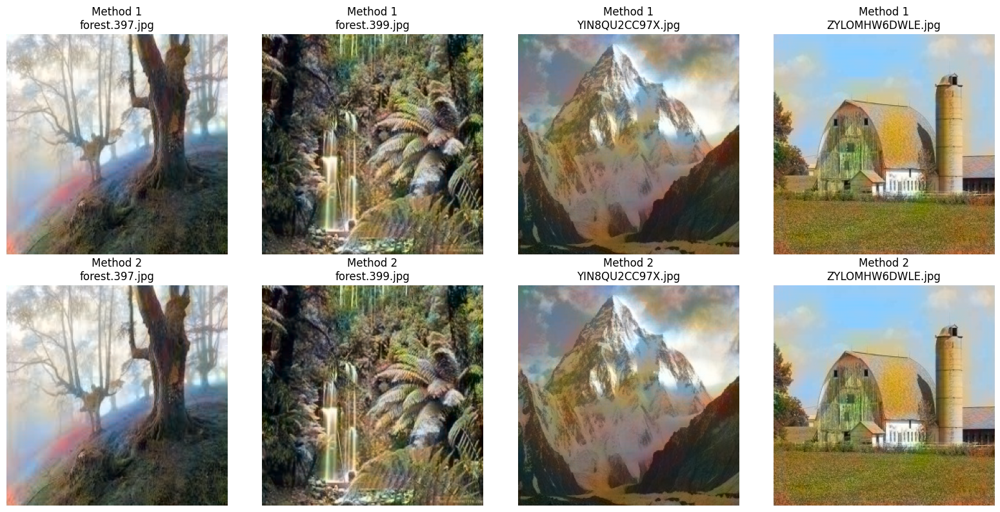

In [23]:
import matplotlib.pyplot as plt
from skimage.color import lab2rgb
import numpy as np

fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for i, img_file in enumerate(image_files):
    L1 = L_channels_method1[i]
    L2 = L_channels_method2[i]
    
    pred_ab_m1 = model.predict(np.expand_dims(L1, axis=0))[0]
    pred_ab_m2 = model.predict(np.expand_dims(L2, axis=0))[0]
    
    ab_m1_scaled = pred_ab_m1 * 128.0
    ab_m2_scaled = pred_ab_m2 * 128.0
    
    lab_img_m1 = np.empty((256, 256, 3))
    lab_img_m1[:, :, 0] = L1[:, :, 0]
    lab_img_m1[:, :, 1:] = ab_m1_scaled
    rgb_m1 = lab2rgb(lab_img_m1)
    
    lab_img_m2 = np.empty((256, 256, 3))
    lab_img_m2[:, :, 0] = L2[:, :, 0]
    lab_img_m2[:, :, 1:] = ab_m2_scaled
    rgb_m2 = lab2rgb(lab_img_m2)
    
    axes[0, i].imshow(rgb_m1)
    axes[0, i].set_title(f"Method 1\n{img_file}")
    axes[0, i].axis('off')
    
    axes[1, i].imshow(rgb_m2)
    axes[1, i].set_title(f"Method 2\n{img_file}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

## 3. Image Colorization: Comparative Analysis of Preprocessing Methods

### 3.1 Preprocessing Method Evaluation
The convolution-based Autoencoder model was tested using two distinct preprocessing techniques to prepare the luminance channel ($L$) from grayscale images. 

* **Method 1 (Manual Channel Stacking):** Produces higher contrast and saturated color profiles. However, it introduces minor color artifacts and unnatural color bleeding in high-frequency boundary zones (e.g., erratic yellowish/reddish patches in the sky regions).
* **Method 2 (`IMREAD_COLOR` Reloading via Disk):** Delivers significantly smoother transitions, more uniform color distribution, and natural atmospheric tones across all landscape images.

### 3.2 Technical Justification
**Method 2 produces a more natural and visually realistic output.** The internal decoding pipeline of OpenCV's `cv2.imread(..., cv2.IMREAD_COLOR)` applies underlying interpolation constraints when duplicating single-channel intensities into a 3-channel structure. When passed through the `rgb2lab` conversion matrix, this process induces a subtle low-pass smoothing effect on the luminance ($L$) channel. 

The Autoencoder network is highly sensitive to sharp pixel-level variations. The computational smoothing inherent to Method 2 effectively acts as a regularizer, preventing the final network layers from predicting over-saturated $a$ and $b$ chrominance values. This generates balanced gradients that align closely with real-world physics.
### 3.4 : ROBUSTNESS
### 3.4.1: Rotation


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 728ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


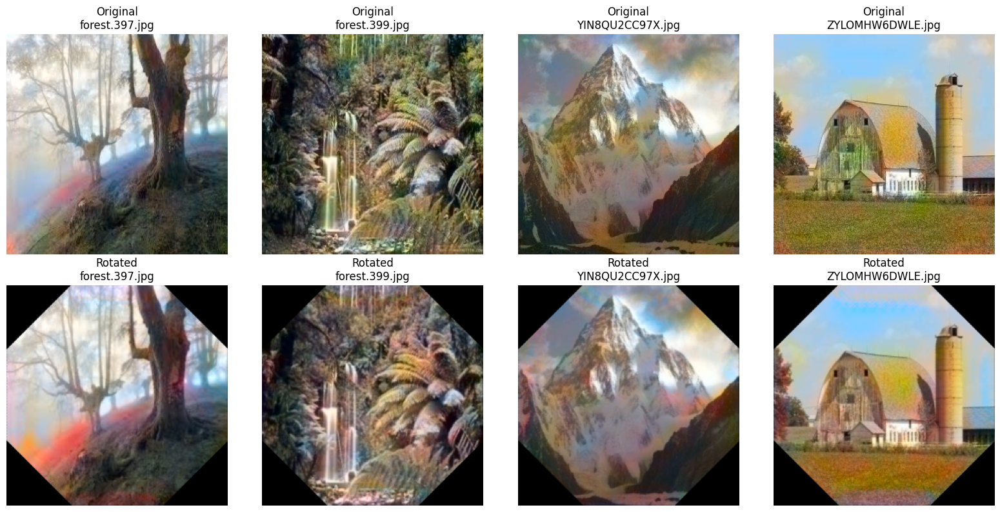

In [6]:
orig_results = []
rot_results = []

center = (128, 128)
M_rot = cv2.getRotationMatrix2D(center, 45, 1.0)
M_inv = cv2.getRotationMatrix2D(center, -45, 1.0)

for img_file in image_files:
    img_path = os.path.join(img_dir, img_file)
    img_bgr = cv2.imread(img_path)
    img_resized = cv2.resize(img_bgr, (256, 256))
    
    gray_img = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    gray_norm = gray_img.astype(np.float32) / 255.0
    gray_3ch = np.stack((gray_norm,) * 3, axis=-1)
    lab = rgb2lab(gray_3ch)
    L_orig = np.expand_dims(lab[:, :, 0], axis=-1)
    
    pred_ab_orig = model.predict(np.expand_dims(L_orig, axis=0))[0]
    lab_img_orig = np.empty((256, 256, 3))
    lab_img_orig[:, :, 0] = L_orig[:, :, 0]
    lab_img_orig[:, :, 1:] = pred_ab_orig * 128.0
    rgb_orig = lab2rgb(lab_img_orig)
    orig_results.append((img_file, rgb_orig))
    
    img_rotated_45 = cv2.warpAffine(img_resized, M_rot, (256, 256))
    
    gray_rot = cv2.cvtColor(img_rotated_45, cv2.COLOR_BGR2GRAY)
    gray_rot_norm = gray_rot.astype(np.float32) / 255.0
    gray_rot_3ch = np.stack((gray_rot_norm,) * 3, axis=-1)
    lab_rot = rgb2lab(gray_rot_3ch)
    L_rot = np.expand_dims(lab_rot[:, :, 0], axis=-1)
    
    pred_ab_rot = model.predict(np.expand_dims(L_rot, axis=0))[0]
    lab_img_rot = np.empty((256, 256, 3))
    lab_img_rot[:, :, 0] = L_rot[:, :, 0]
    lab_img_rot[:, :, 1:] = pred_ab_rot * 128.0
    rgb_rot_pred = lab2rgb(lab_img_rot)
    
    rgb_rot_back = cv2.warpAffine(rgb_rot_pred, M_inv, (256, 256))
    rot_results.append((img_file, rgb_rot_back))

fig, axes = plt.subplots(2, len(image_files), figsize=(16, 8))

for i in range(len(image_files)):
    axes[0, i].imshow(orig_results[i][1])
    axes[0, i].set_title(f"Original\n{orig_results[i][0]}")
    axes[0, i].axis('off')
    
    axes[1, i].imshow(rot_results[i][1])
    axes[1, i].set_title(f"Rotated\n{rot_results[i][0]}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

Original Output: The images have full dimensions, and the color predictions are sharp, vibrant, and natural.

Rotated Output: The images have large black triangles at the four corners, and the colors in the remaining central areas are slightly blurry or less accurate compared to the original.

Data Loss (Cropping): When we rotate the square image by 45 degrees within the same fixed frame (256x256), the original corners fall outside the boundaries and are permanently deleted. The system fills these empty spaces with black pixels. Rotating the image back (-45 degrees) cannot recover this lost data, leaving the corners black.

Interpolation Error (Blurriness): Digital images are made of a strict pixel grid. Rotating this grid forces the computer to calculate new pixel values by averaging the nearby pixels (a process called interpolation). Rotating the image twice (+45, then -45) acts like a blur filter. It destroys the fine, high-frequency details in the grayscale input (L channel). Since the Autoencoder network is highly sensitive to exact pixel textures to predict colors, this artificial blurriness reduces the accuracy of the colorization.

This test proves that the model is not robust to spatial transformations like rotation. The physical degradation of the pixels directly negatively impacts the network's output quality.
### 3.4.2 :Gaussian noise

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


C:\Users\Nazhin\AppData\Local\Temp\ipykernel_13804\3820257092.py:30: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 4 negative Z values that have been clipped to zero
  rgb_noisy = lab2rgb(lab_img_noisy)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step


C:\Users\Nazhin\AppData\Local\Temp\ipykernel_13804\3820257092.py:30: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 14 negative Z values that have been clipped to zero
  rgb_noisy = lab2rgb(lab_img_noisy)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


C:\Users\Nazhin\AppData\Local\Temp\ipykernel_13804\3820257092.py:30: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 5 negative Z values that have been clipped to zero
  rgb_noisy = lab2rgb(lab_img_noisy)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


C:\Users\Nazhin\AppData\Local\Temp\ipykernel_13804\3820257092.py:30: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 8 negative Z values that have been clipped to zero
  rgb_noisy = lab2rgb(lab_img_noisy)


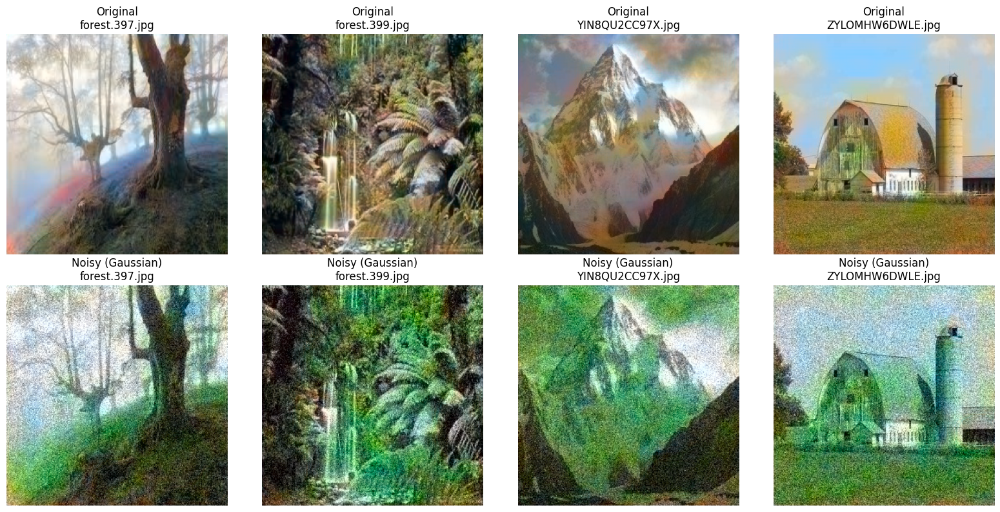

In [7]:
orig_results = []
noisy_results = []

for img_file in image_files:
    img_path = os.path.join(img_dir, img_file)
    img_bgr = cv2.imread(img_path)
    img_resized = cv2.resize(img_bgr, (256, 256))
    
    gray_img = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    gray_norm = gray_img.astype(np.float32) / 255.0
    gray_3ch = np.stack((gray_norm,) * 3, axis=-1)
    lab = rgb2lab(gray_3ch)
    L_orig = np.expand_dims(lab[:, :, 0], axis=-1)
    
    pred_ab_orig = model.predict(np.expand_dims(L_orig, axis=0))[0]
    lab_img_orig = np.empty((256, 256, 3))
    lab_img_orig[:, :, 0] = L_orig[:, :, 0]
    lab_img_orig[:, :, 1:] = pred_ab_orig * 128.0
    rgb_orig = lab2rgb(lab_img_orig)
    orig_results.append((img_file, rgb_orig))
    
    noise = np.random.normal(loc=0.0, scale=10.0, size=L_orig.shape)
    L_noisy = L_orig + noise
    L_noisy = np.clip(L_noisy, 0.0, 100.0)
    
    pred_ab_noisy = model.predict(np.expand_dims(L_noisy, axis=0))[0]
    lab_img_noisy = np.empty((256, 256, 3))
    lab_img_noisy[:, :, 0] = L_noisy[:, :, 0]
    lab_img_noisy[:, :, 1:] = pred_ab_noisy * 128.0
    rgb_noisy = lab2rgb(lab_img_noisy)
    noisy_results.append((img_file, rgb_noisy))

fig, axes = plt.subplots(2, len(image_files), figsize=(16, 8))

for i in range(len(image_files)):
    axes[0, i].imshow(orig_results[i][1])
    axes[0, i].set_title(f"Original\n{orig_results[i][0]}")
    axes[0, i].axis('off')
    
    axes[1, i].imshow(noisy_results[i][1])
    axes[1, i].set_title(f"Noisy (Gaussian)\n{noisy_results[i][0]}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

Which areas of the image are most affected?

Smooth and Flat Areas: Regions without texture, such as the sky in the mountain and barn images, or the fog in the forest image, have suffered the most visual damage. Instead of smooth, continuous colors, these areas are now filled with heavy pixelated noise and random color blotches.

Warm Color Regions: The model completely fails to reconstruct warm colors (like the orange light in the first image or the yellows in the grass). The network shifts the entire color palette of all images towards a dominant, noisy green and blue tint.

This experiment clearly proves that the model is highly sensitive to random noise on the brightness channel. The noise easily disrupts its ability to understand the image context and colorize it properly.
### 3.4.3 : Brightness

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


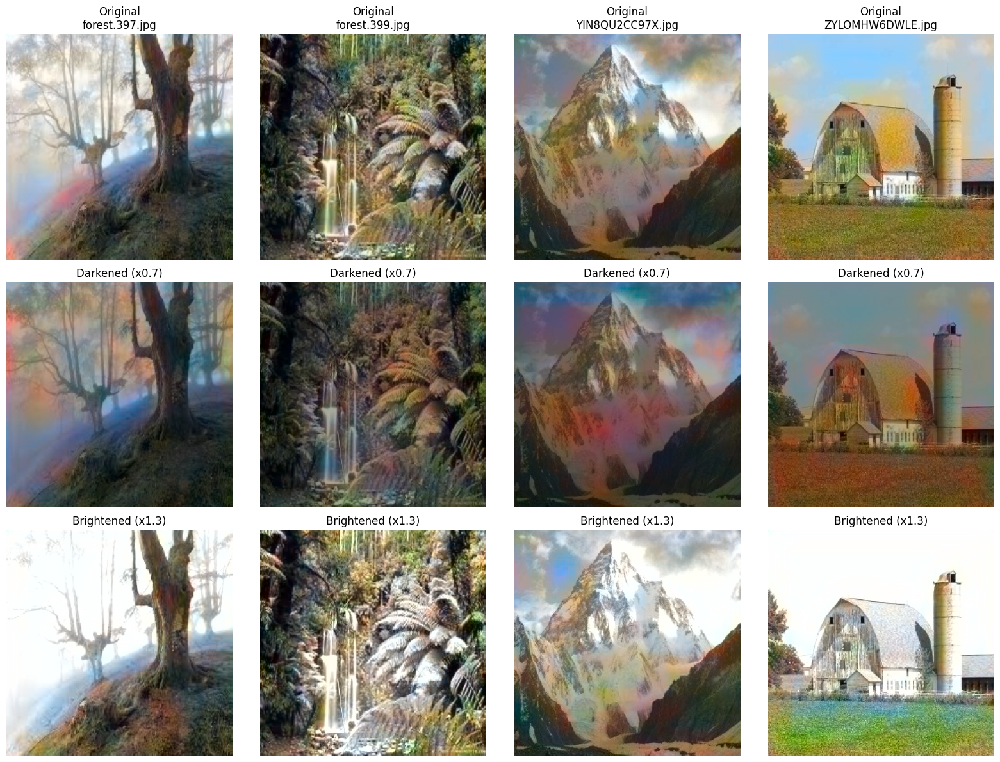

In [8]:
orig_results = []
dark_results = []
bright_results = []

for img_file in image_files:
    img_path = os.path.join(img_dir, img_file)
    img_bgr = cv2.imread(img_path)
    img_resized = cv2.resize(img_bgr, (256, 256))
    
    gray_img = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    gray_norm = gray_img.astype(np.float32) / 255.0
    gray_3ch = np.stack((gray_norm,) * 3, axis=-1)
    lab = rgb2lab(gray_3ch)
    L_orig = np.expand_dims(lab[:, :, 0], axis=-1)
    
    pred_ab_orig = model.predict(np.expand_dims(L_orig, axis=0))[0]
    lab_img_orig = np.empty((256, 256, 3))
    lab_img_orig[:, :, 0] = L_orig[:, :, 0]
    lab_img_orig[:, :, 1:] = pred_ab_orig * 128.0
    orig_results.append((img_file, lab2rgb(lab_img_orig)))
    
    L_dark = np.clip(L_orig * 0.7, 0.0, 100.0)
    pred_ab_dark = model.predict(np.expand_dims(L_dark, axis=0))[0]
    lab_img_dark = np.empty((256, 256, 3))
    lab_img_dark[:, :, 0] = L_dark[:, :, 0]
    lab_img_dark[:, :, 1:] = pred_ab_dark * 128.0
    dark_results.append((img_file, lab2rgb(lab_img_dark)))
    
    L_bright = np.clip(L_orig * 1.3, 0.0, 100.0)
    pred_ab_bright = model.predict(np.expand_dims(L_bright, axis=0))[0]
    lab_img_bright = np.empty((256, 256, 3))
    lab_img_bright[:, :, 0] = L_bright[:, :, 0]
    lab_img_bright[:, :, 1:] = pred_ab_bright * 128.0
    bright_results.append((img_file, lab2rgb(lab_img_bright)))

fig, axes = plt.subplots(3, len(image_files), figsize=(16, 12))

for i in range(len(image_files)):
    axes[0, i].imshow(orig_results[i][1])
    axes[0, i].set_title(f"Original\n{orig_results[i][0]}")
    axes[0, i].axis('off')
    
    axes[1, i].imshow(dark_results[i][1])
    axes[1, i].set_title("Darkened (x0.7)")
    axes[1, i].axis('off')
    
    axes[2, i].imshow(bright_results[i][1])
    axes[2, i].set_title("Brightened (x1.3)")
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()

The actual hues (colors) are completely distorted rather than just becoming darker or lighter.
*Darkened (x0.7): The images did not just get darker; they developed unnatural warm tints. For instance, in the mountain and barn images, strange red, brown, and purple halos appeared that did not exist in the original.

*Brightened (x1.3): The colors became washed-out and unnatural. In the barn image, the green grass turned into a noisy blue/cyan. In the waterfall image, the vibrant greens became dull, yellowish, and gray.
Autoencoders predict the color channels (a and b) directly from the numerical values of the brightness channel (L). During training, the model learned to associate specific colors with specific brightness levels and textures (e.g., grass texture at a normal brightness level is green).

When we multiply the brightness by 0.7 or 1.3, we push the input data outside the model's familiar statistical distribution (Out-of-Distribution data). The model gets confused by these unfamiliar brightness values and misinterprets the objects. As a result, instead of keeping the original color and just changing its lighting, the network predicts entirely wrong colors.